# importing required libraries


In [2]:
import tensorflow as tf
import numpy as np
from tensorflow.keras import layers, models
import os
import matplotlib.pyplot as plt

loading dataset

In [3]:
import tensorflow_datasets as tfds

(train_dataset, test_dataset), info = tfds.load(
    'horses_or_humans',
    split=['train','test'],
    as_supervised=True,
    with_info=True,
)
print(info)

Dl Completed...: 0 url [00:00, ? url/s]

Dl Size...: 0 MiB [00:00, ? MiB/s]

Generating splits...:   0%|          | 0/2 [00:00<?, ? splits/s]

Generating train examples...: 0 examples [00:00, ? examples/s]

Shuffling /root/tensorflow_datasets/horses_or_humans/incomplete.COBL6F_3.0.0/horses_or_humans-train.tfrecord*.…

Generating test examples...: 0 examples [00:00, ? examples/s]

Shuffling /root/tensorflow_datasets/horses_or_humans/incomplete.COBL6F_3.0.0/horses_or_humans-test.tfrecord*..…

Dataset horses_or_humans downloaded and prepared to /root/tensorflow_datasets/horses_or_humans/3.0.0. Subsequent calls will reuse this data.
tfds.core.DatasetInfo(
    name='horses_or_humans',
    full_name='horses_or_humans/3.0.0',
    description="""
    A large set of images of horses and humans.
    """,
    homepage='http://laurencemoroney.com/horses-or-humans-dataset',
    data_dir='/root/tensorflow_datasets/horses_or_humans/3.0.0',
    file_format=tfrecord,
    download_size=153.59 MiB,
    dataset_size=153.53 MiB,
    features=FeaturesDict({
        'image': Image(shape=(300, 300, 3), dtype=uint8),
        'label': ClassLabel(shape=(), dtype=int64, num_classes=2),
    }),
    supervised_keys=('image', 'label'),
    disable_shuffling=False,
    nondeterministic_order=False,
    splits={
        'test': <SplitInfo num_examples=256, num_shards=1>,
        'train': <SplitInfo num_examples=1027, num_shards=2>,
    },
    citation="""@ONLINE {horses_or_humans,
    author = "Laurence 

In [4]:
info.features['label'].names

['horses', 'humans']

0


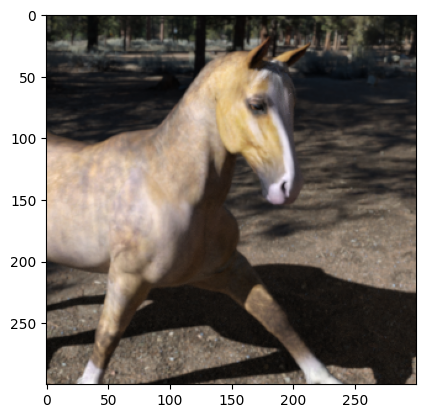

In [5]:
for image,label in train_dataset:
  print (label.numpy())
  plt.imshow(image.numpy())
  break

In [6]:
l1=[int(label)  for image,label in train_dataset]

In [7]:
l1

[0,
 0,
 0,
 0,
 0,
 0,
 0,
 1,
 1,
 1,
 1,
 1,
 0,
 1,
 1,
 1,
 1,
 0,
 1,
 1,
 0,
 0,
 1,
 1,
 1,
 1,
 0,
 1,
 1,
 1,
 0,
 0,
 1,
 0,
 0,
 1,
 1,
 1,
 0,
 1,
 1,
 0,
 1,
 1,
 1,
 0,
 1,
 1,
 1,
 1,
 0,
 1,
 0,
 1,
 0,
 1,
 0,
 1,
 0,
 0,
 0,
 0,
 1,
 1,
 0,
 1,
 0,
 1,
 1,
 1,
 0,
 1,
 0,
 0,
 0,
 0,
 0,
 1,
 0,
 0,
 0,
 1,
 1,
 0,
 1,
 0,
 1,
 0,
 1,
 1,
 1,
 1,
 0,
 1,
 1,
 0,
 0,
 1,
 1,
 1,
 1,
 0,
 1,
 1,
 0,
 1,
 0,
 0,
 1,
 1,
 0,
 1,
 1,
 0,
 1,
 1,
 0,
 0,
 0,
 1,
 0,
 0,
 1,
 1,
 0,
 0,
 1,
 1,
 0,
 1,
 1,
 1,
 1,
 1,
 0,
 1,
 1,
 1,
 1,
 0,
 0,
 0,
 1,
 1,
 1,
 1,
 0,
 0,
 1,
 0,
 1,
 0,
 1,
 1,
 1,
 0,
 1,
 1,
 1,
 0,
 1,
 1,
 0,
 0,
 0,
 0,
 1,
 0,
 0,
 1,
 0,
 0,
 1,
 0,
 1,
 1,
 0,
 1,
 1,
 1,
 0,
 0,
 0,
 0,
 1,
 1,
 0,
 0,
 1,
 1,
 1,
 1,
 0,
 0,
 0,
 0,
 0,
 1,
 1,
 0,
 1,
 1,
 0,
 1,
 1,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 1,
 0,
 1,
 0,
 1,
 1,
 1,
 0,
 0,
 0,
 0,
 1,
 1,
 1,
 1,
 1,
 0,
 0,
 1,
 0,
 0,
 1,
 1,
 0,
 0,
 1,
 1,
 1,
 0,
 0,
 1,
 1,
 0,
 1,
 0,
 0,
 0,


In [8]:
from collections import Counter
Counter(l1)

Counter({0: 500, 1: 527})

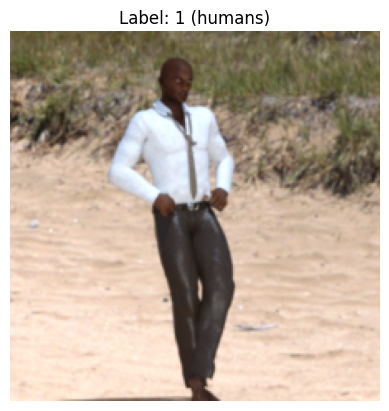

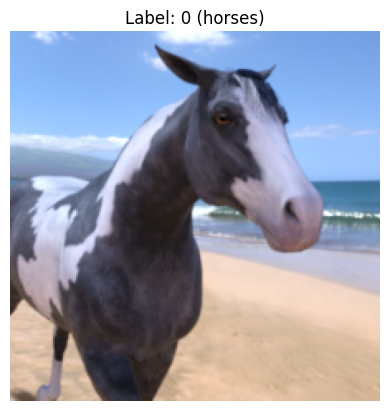

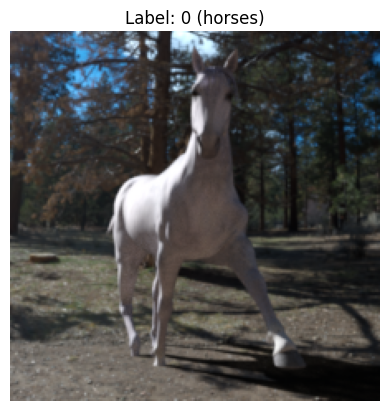

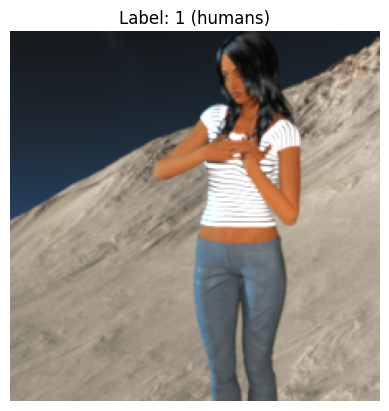

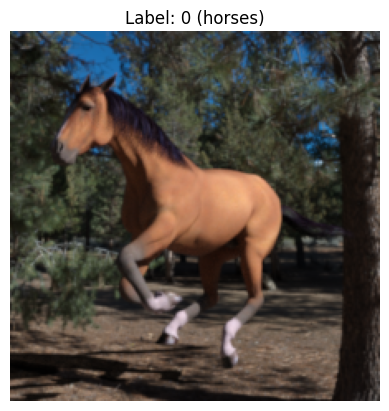

...

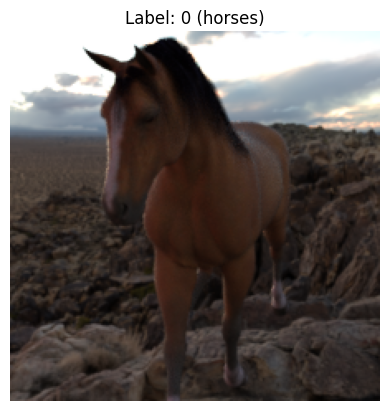

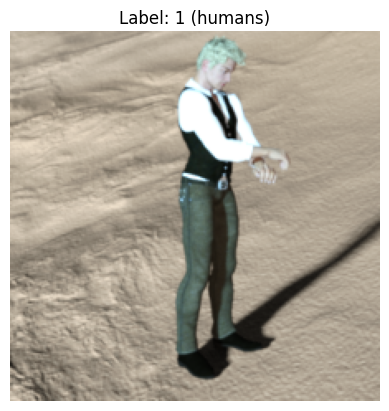

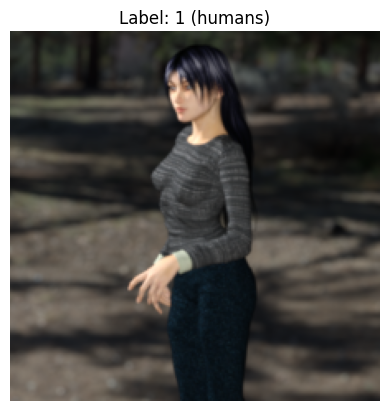

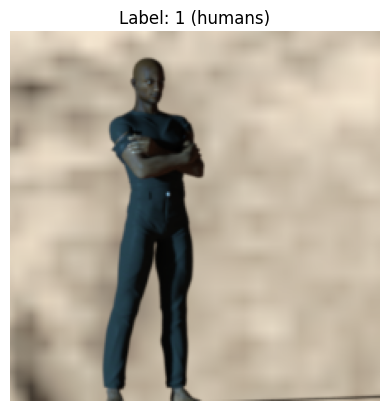

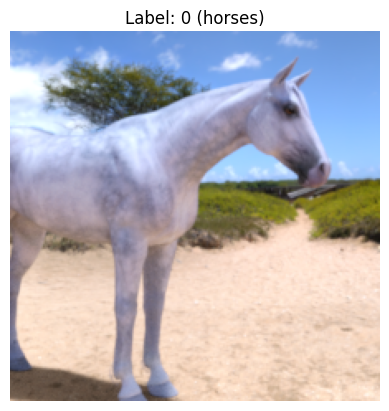

In [11]:
class_names = info.features['label'].names

for images, labels in train_ds.take(2):
  for image, label in zip(images, labels):
    plt.imshow(image)
    plt.title(f"Label: {label.numpy()} ({class_names[label.numpy()]})")
    plt.axis('off')
    plt.show()

Preprocessing the data

In [10]:
IMG_SIZE = 224
BATCH_SIZE=32
def preprocess_img(image, label):
  image = tf.image.resize(image,[IMG_SIZE,IMG_SIZE])
  image = tf.cast(image,tf.float32)/255.0
  return image,label
train_ds = train_dataset.map(preprocess_img).shuffle(1000).batch(BATCH_SIZE)
test_ds = test_dataset.map(preprocess_img).batch(BATCH_SIZE)

training classifier

In [12]:
model = models.Sequential([
    layers.Conv2D(32, (3, 3), activation='relu', input_shape=(IMG_SIZE, IMG_SIZE, 3)),
    layers.MaxPooling2D((2, 2)),

    layers.Conv2D(64, (3, 3), activation='relu'),
    layers.MaxPooling2D((2, 2)),

    layers.Conv2D(128, (3, 3), activation='relu'),
    layers.MaxPooling2D((2, 2)),

    layers.Flatten(),
    layers.Dense(128, activation='relu'),
    layers.Dense(1, activation='sigmoid')
])

model.summary()

/usr/local/lib/python3.12/dist-packages/keras/src/layers/convolutional/base_conv.py:113: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d (Conv2D)                 │ (None, 222, 222, 32)   │           896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d (MaxPooling2D)    │ (None, 111, 111, 32)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_1 (Conv2D)               │ (None, 109, 109, 64)   │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_1 (MaxPooling2D)  │ (None, 54, 54, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_2 (Conv2D)               │ (None, 52, 52, 128)    │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_2 (MaxPooling2D)  │ (None, 26, 26, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten (Flatten)               │ (None, 86528)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 128)            │    11,075,712 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 1)              │           129 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 11,169,089 (42.61 MB)

 Trainable params: 11,169,089 (42.61 MB)

 Non-trainable params: 0 (0.00 B)

Compile model

In [13]:
model.compile(optimizer='adam',loss='binary_crossentropy',metrics=['accuracy'])


train the model

In [14]:
history = model.fit(train_ds,epochs=10,validation_data=test_ds)

Epoch 1/10
33/33 ━━━━━━━━━━━━━━━━━━━━ 14s 176ms/step - accuracy: 0.7038 - loss: 0.6761 - val_accuracy: 0.8047 - val_loss: 1.2467
Epoch 2/10
33/33 ━━━━━━━━━━━━━━━━━━━━ 3s 59ms/step - accuracy: 0.9507 - loss: 0.1762 - val_accuracy: 0.8594 - val_loss: 1.2722
Epoch 3/10
33/33 ━━━━━━━━━━━━━━━━━━━━ 2s 59ms/step - accuracy: 0.9822 - loss: 0.0490 - val_accuracy: 0.8008 - val_loss: 1.9097
Epoch 4/10
33/33 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - accuracy: 0.9925 - loss: 0.0166 - val_accuracy: 0.8398 - val_loss: 1.7872
Epoch 5/10
33/33 ━━━━━━━━━━━━━━━━━━━━ 2s 59ms/step - accuracy: 1.0000 - loss: 0.0048 - val_accuracy: 0.8125 - val_loss: 3.5696
Epoch 6/10
33/33 ━━━━━━━━━━━━━━━━━━━━ 2s 59ms/step - accuracy: 1.0000 - loss: 2.6433e-04 - val_accuracy: 0.8125 - val_loss: 3.8520
Epoch 7/10
33/33 ━━━━━━━━━━━━━━━━━━━━ 3s 59ms/step - accuracy: 1.0000 - loss: 1.6936e-04 - val_accuracy: 0.8125 - val_loss: 4.0109
Epoch 8/10
33/33 ━━━━━━━━━━━━━━━━━━━━ 3s 63ms/step - accuracy: 1.0000 - loss: 7.6212e-05 - val_accura

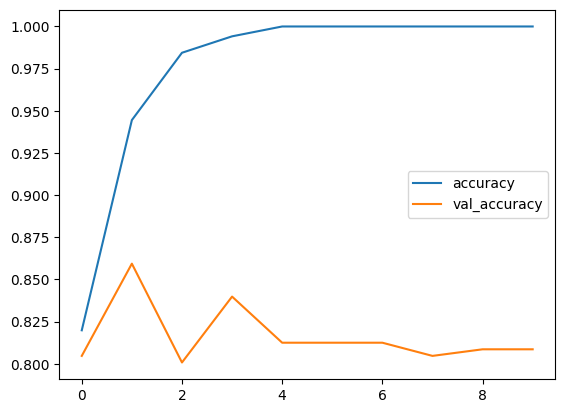

In [16]:
plt.plot(history.history['accuracy'],label='accuracy')
plt.plot(history.history['val_accuracy'],label='val_accuracy')
plt.legend()
plt.show()

**Blatantly overfitting **

In [19]:
from PIL import Image
url = "https://i.pinimg.com/736x/52/7c/1f/527c1f2c32c1301355da1edda82628ee.jpg"
image_path = tf.keras.utils.get_file("random.jpg", origin=url)
img = Image.open(image_path)

52004/52004 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step
